In [1]:
import numpy as np
from scipy.sparse import diags, csr_matrix
from scipy.sparse.linalg import spsolve, norm #, inv, eigsh

import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
from matplotlib import rc

from matplotlib import animation # animaciones
from IPython.display import HTML # ver animaciones en notebook

#from celluloid import Camera #pip install celluloid si es que no lo tienen.

*Universidad de Chile*  
*Facultad de Ciencias Físicas y Matemáticas*  
*Departamento de Ingeniería Matemática*

**MA5307-1 Análisis Numérico de EDP: Teoría y Laboratorio**  
**Profesor:** Axel Osses  
**Auxiliares:** Tomás Banduc & Cristóbal Godoy

Integrantes - Grupo 9
* Allen Arroyo G.
* Isidora Miranda
* Iñaki Ramirez

# Laboratorio 2

**Objetivo General:** Aplicar el Método de Diferencias Finitas en varias variables sobre modelos de evolución de primer orden.

**Objetivo Particular:** Se estudiará la ecuación de advección de primer orden y la ecuación de Burgers como modelo no-lineal en el estudio del tráfico vehicular.

# Parte I

## Ecuación de Advección

Sea el problema de advección de primer orden sujeto a condición de borde periódica sobre el intervalo $(0,1)$:<br>
<br>
\begin{align*}
(A)\quad\left\{
\begin{array}{rll}
\displaystyle{\frac{\partial u}{\partial t}+\alpha\frac{\partial u}{\partial x}}  &
=0 & \qquad\text{para }\left(  t,x\right)  \in(0,+\infty)\times\left(  0,1\right) \\
u(t,x+1)  &  =u(t,x) & \qquad\text{para }\left(  t,x\right)  \in\lbrack
0,+\infty)\times\left[0,1\right] \\
u\left(  0,x\right)   &  =u_{0}(x) & \qquad\text{para }x\in\left[0,1\right]
\end{array}
\right.
\end{align*}

con $\alpha>0$y $u_0$ suficientemente regular.

Existen varios esquemas numéricos basados en diferencias finitas para analizar la ecuación anterior. Dadas sus particularidades, elegir un método por sobre otro resulta difícil.

Los esquemas de tipo Lax son frecuentemente utilizados para resolver este tipo de problemas, siendo los más simples los de Lax-Friedrichs y Lax-Wendroff, dados por:

\begin{align*}
    &(LF)\quad\dfrac{2u_j^{n+1}-(u_{j+1}^n+u_{j-1}^n)}{2\Delta t} +\alpha\cdot \dfrac{u_{j+1}^n - u_{j-1}^n}{2\Delta x} = 0\\
    &(LW)\quad \dfrac{u_j^{n+1}-u_j^n}{\Delta t}+\alpha \cdot \dfrac{u_{j+1}^n-u_{j-1}^n}{2\Delta x}+\alpha^2 \Delta t\cdot\dfrac{2u_j^n-(u_{j+1}^n+u_{j-1}^n)}{2\Delta x^2} = 0
\end{align*}
<br>
donde $u_j^n:=u(x_j,t_n)$ es la aproximación de una función $u$ para un mallado espacial de paso $\Delta x>0$ y una discretización temporal $\Delta t>0$, con $x_j:=\Delta x \cdot j$ y $t_n:=\Delta t\cdot n$

### P1

> **a.** Programe una función `resolver_adveccion` que resuelva numéricamente esta ecuación hasta tiempo $T>0$ por cada uno de los esquemas numéricos presentados anteriormente. Las entradas del programa deben ser $\alpha$, $\Delta t$, $N_{T}$, $N$ y $u_{0}$, donde $N_{T}$ es un entero que satsiface $N_t\Delta t = T$ y corresponde con una discretización del intervalo $[0,T]$ en $N_T+1$ puntos:<br>
<br>
\begin{align*}
 I_T:=\{0,\Delta t,...,(N_T-1)\Delta t,N_T\Delta t \}\subseteq [0,T]
 \end{align*}

Despejando $u^{n+1}_j$ de los esquemas $(LF)$ y $(LW)$ obtenemos :



\begin{align*}
(LF) \hspace{5mm} u^{n+1}_j  &= \Delta t \big(\dfrac{u_{j+1}^n+u_{j-1}^n}{2\Delta t} - \alpha\cdot \dfrac{u_{j+1}^n - u_{j-1}^n}{2\Delta x} \big) \\
&= \dfrac{u_{j+1}^n+u_{j-1}^n}{2} - \dfrac{\alpha \Delta t}{Δx} \cdot \dfrac{u_{j+1}^n - u_{j-1}^n}{2}
\end{align*}


\begin{align*}
(LW) \hspace{5mm} u^{n+1}_j &= Δt \big(\dfrac{u^n_{j}}{\Delta t}-\alpha\dfrac{u_{j+1}^n-u_{j-1}^n}{2\Delta x}-\alpha^2 \Delta t \dfrac{2u_j^n-(u_{j+1}^n+u_{j-1}^n)}{2\Delta x^2}\big)  \\
&= u^n_j - \dfrac{\alpha \Delta t}{\Delta x} \big(\dfrac{u^n_{j+1}-u^n_{j-1}}{2} \big)- \dfrac{α^2Δt^2}{Δx^2}\big( \dfrac{2u_j^n-(u_{j+1}^n+u_{j-1}^n)}{2}\big)
\end{align*}

Se puede definir el parametro $ \beta := \dfrac{α Δt}{Δx}$ para simplicar notación

In [ ]:
def resolver_adveccion(alpha, dt, NT, N, u0, esquema):
    """
    Resuelve la ecuación de advección $\partial_t u + \alpha \partial_x u = 0$
    con condiciones periódicas, en el dominio (0,1) y un intervalo de tiempo [0,T].
    -------
    Input:
    - alpha: float
    - dt: float
        Paso temporal para el que se resolvera la ecuación.
    - NT: int
        Cumple NT * dt = T.
    - N: int
        Cantidad de subintervalos en que se discretizará el dominio.
    - u0: callable
        Función con la condición inicial del problema.
    - esquema: {'LW', 'LF'}
        Esquema usado para resolver la ecuación.
        - 'LW': Lax-Wendroff
        - 'LF': Lax-Friedrich
    -------
    Output:
    - x: numpy array, largo N+2
        Discretización del dominio donde se calculó la solución.
    - U: numpy array de (N+2)x(NT+1)
        Solución, evaluada en la grilla en cada paso de tiempo. U[j,n] es la solución en x_j,
        en el tiempo t = n*dt.
    -------
    """

    x = np.linspace(0,1,N+2)
    U = np.zeros((N+2,NT+1))
    dx = 1/(N+1)
    beta = (alpha*dt)/dx

    # Condición Inicial  u(0,x) = u_0(x):
    for j in range(N+2) :
      z = j*dx
      U[j,0] =u0(z)

    for n in range(NT) : # es NT+1To NT?
      for j in range(N+2) :
       if esquema == "LF" :
        # (LF) u^{n+1}_j = (u_{j+1}^n+ u_{j-1}^n})/2 - \alpha\Deltat/Δx \cdot \dfrac{u_{j+1}^n - u_{j-1}^n}{2}
          if ( not j == 0 ) and ( not j == N+1) :
             U[j,n+1] = (1/2)*(U[j+1,n] + U[j-1,n]) - (beta/2) * (U[j+1,n] - U[j-1,n])
        # Cond. de peridocidad es tal que : U[j+1,n] = U[j,n] =>
          if j == 0 : #  Espacio en el valor inicial j = 0.
             U[j,n+1] = (1/2) * (U[j+1,n] + U[N,n]) - (beta/2) * (U[j+1,n] - U[N,n])
          if j == N+1 : #  Espacio en el valor inicial j = N+1.
             U[j,n+1] = (1/2) * (U[1,n] + U[j-1,n]) - (beta/2) * (U[1,n] - U[j-1,n])
       if esquema == "LW" :
        #(LW) u^n_j - \alpha\Deltat/ \Deltax (\dfrac{u^n_{j+1}-u^n_{j-1}}{2} )- α^2Δt^2/Δx^2(\dfrac{2u_j^n-(u_{j+1}^n+u_{j-1}^n)}{2})
           if ( not j == 0 ) and ( not j == N+1) :
             U[j,n+1] = U[j,n] - (beta/2)*(U[j+1,n] - U[j-1,n]) - ((beta**2)/2)* (2*U[j,n]- U[j+1,n] - U[j-1,n]) #habia puesto U[j+1,n] + U[j-1,n]
           if j == 0 :
             U[j,n+1] = U[j,n] - (beta/2)*(U[j+1,n] - U[N,n]) - ((beta**2)/2) * (2*U[j,n]- U[j+1,n] - U[N,n])
           if j == N+1 :
             U[j,n+1] = U[j,n] - (beta/2)*(U[1,n] - U[j-1,n]) - ((beta**2)/2) * (2*U[j,n]- U[1,n] - U[j-1,n])
    return x,U

    return x, U

> **b.** Considere $\Delta x=0.01$, $\alpha=1$, $\Delta t = \frac{\lambda}{\alpha}\Delta x$, $T=2$ y la condición inicial $u_{0}\left(  x\right)  =\sin\left(  2\pi x\right)  $. Calcule la solución numérica para $\lambda\in\left\{  0.8,0.4,0.1\right\}  $ y, para cada valor de $\lambda$, grafique los resultados de cada método junto con la solución exacta.<br>
<br> **Indicación**: Discuta los resultados en función de $\lambda$ y del tipo de
ecuación equivalente asociada a cada esquema. <br>
<br>**Indicación:** Cree una animación para observar la evolución de sus soluciones. Puede serle útil Investigar el método ```FuncAnimation``` de ```matplotlib```.



In [ ]:
from IPython.display import HTML

In [ ]:
# Creado con ayuda de ChatGPT :

def animar_soluciones(x, ULF, ULW, u_real,dt,t,NT,alpha,lanbda,dx) :
    """
    Función para graficar y animar las soluciones de cada método.
    Utiliza la función FuncAnimation de matplotlib.
    --------
    Input:
    - x: array
        Discretización de [0,1].
    - ULF, ULF: array
        Soluciones obtenidas con `resolver_adveccion` con los métodos LF y LW resp.
    - u: callable
        Función que entrega la solución real de la ecuación.
    --------
    Output:
    - ani: Objeto Animation de matplotlib.
        Puede utilizar el método HTML(ani.to_html5_video()) para ver en jupyter.
    --------
    """

    # Parámetros de tiempo
    #NT = ULF.shape[1] - 1 # Número de pasos de tiempo

    # Crear figura
    fig, ax = plt.subplots()
    #ax.set_xlim(0, 1)
    #ax.set_ylim(np.min([ULF[1], ULW[1], u_real]) - 0.1, np.max([ULF[1], ULW[1], u_real]) + 0.1)
    ax.set_xlabel("x")
    ax.set_ylabel("u(x,t)")
    ax.set_title("Comparación entre métodos numéricos y solución real")

    # Inicializar líneas
    linea_LF, = ax.plot(x,ULF[:,0], label='LF', color='blue')
    linea_LW, = ax.plot(x,ULW[:,0], label='LW', color='orange')
    linea_u,  = ax.plot(x,u_real(x,t[0],alpha), label='u_real', color='green')

    ax.legend()
    plt.close()
    # Función de animación
    def animate(i):
        linea_LF.set_data(x, ULF[:, i])
        linea_LW.set_data(x, ULW[:, i])
        linea_u.set_data(x, u_real(x,t[i],alpha) )

        ax.set_title(f"Aproximaciones LW y LF para λ = {lanbda:.2f} con Δx = {dx:.2f}\nt = {t[i]:.2f}",fontfamily='monospace')
        # ax.set_title(f"t = {t[i]:.2f}")
        return [linea_LF, linea_LW, linea_u]

    # Crear la animación
    ani = animation.FuncAnimation(fig, animate, frames=NT+1, interval=30, blit=True, repeat=True)
    # ani.save("grafico" + str(lanbda) + ".gif") # se guarda en la carpeta de la izquierda de colab como .gif
    return HTML(ani.to_html5_video())

In [ ]:
def u0(x):
        return np.sin(2*np.pi*x)
def u_real(x,t,alpha):
  return np.sin(2*np.pi*(x-alpha*t))

def graficar_aproximaciones(lanbda,alpha,dx,T):

    dt = (lanbda*dx)/alpha
    NT = int(T / dt) # Esto es así por enunciado
    t = np.linspace(0,T,NT+1)

    N = int(1/dx - 1) #Puntos interiores totales ??
    #N = N+1
    x, ULF = resolver_adveccion(alpha, dt, NT, N, u0, "LF")
    x, ULW = resolver_adveccion(alpha, dt, NT, N, u0, "LW")
    # u_real = u(x,t,alpha)
    return animar_soluciones(x, ULF, ULW, u_real,dt,t,NT,alpha,lanbda,dx)

In [ ]:
graficar_aproximaciones(lanbda=0.8,alpha=1,dx=0.01,T=2)

In [ ]:
graficar_aproximaciones(lanbda=0.1,alpha=1,dx=0.01,T=2)

In [ ]:
graficar_aproximaciones(lanbda=0.4,alpha=1,dx=0.01,T=2)

> **c.** Repita lo anterior, considerando ahora la condición inicial: <br>
<br>
\begin{align*}
u_{0}\left(  x\right)  =\left\{
\begin{array}
[c]{cl}
1/2 & \text{si }x\in\left[  0.3,0.7\right]  \\
-1/2 & \text{si }x\in\left[  0,1\right]  \setminus [  0.3,0.7]
\end{array}
\right.
\end{align*}<br>
**Indicación:** Considere una extensión periódica de $u_{0}$, la cual puede ser útil para graficar la solución real.

In [ ]:
# Definimos u0 como el enunciado :

def u0(x) :
  if type(x) == np.float64 :
    if x >= 0.3 and x <= 0.7 :
      return 0.5
    else :
      return -0.5

  else :
    n = len(x)
    v = np.zeros(n)
    for j in range(n) :
      if x[j] >= 0.3 and x[j] <= 0.7 :
        v[j] = 0.5
      else :
        v[j] = -0.5
  return v
# Y la extendemos u0, comoo puede ser un array
def u0_periodica(x, T=1.0):
  return u0(np.mod(x,T))

def u_real_periodica(x,t,alpha):
  return u0_periodica(x - alpha*t)

In [ ]:
def graficar_aproximaciones_parte_c(lanbda,alpha,dx,T):

    dt = (lanbda*dx)/alpha
    NT = int(T / dt) # Esto es así por enunciado
    t = np.linspace(0,T,NT+1)

    N = int(1/dx - 1) #Puntos interiores totales ??
    #N = N+1
    x, ULF = resolver_adveccion(alpha, dt, NT, N, u0_periodica, "LF")
    x, ULW = resolver_adveccion(alpha, dt, NT, N, u0_periodica, "LW")

    return animar_soluciones(x, ULF, ULW, u_real_periodica,dt,t,NT,alpha,lanbda,dx)

La Animación que más tiempo toma es con $λ = 0.1$ tardando 2-3 minutos con $interval=30$, la más rapida es con $ \lambda = 0.8$ con 23s y luego $λ = 0.1$ con 45s.

In [ ]:
graficar_aproximaciones_parte_c(lanbda=0.8,alpha=1,dx=0.01,T=2)

In [ ]:
graficar_aproximaciones_parte_c(lanbda=0.4,alpha=1,dx=0.01,T=2)

In [ ]:
graficar_aproximaciones_parte_c(lanbda=0.1,alpha=1,dx=0.01,T=2)

# Parte II

## Ecuación de Burgers en Tráfico Vehicular

Uno de los problemas más complicados en la ingeniería de transporte es modelar el funcionamiento de los semáforos. Un modelo continuo para el tráfico en una única pista, donde no se permite adelantar automóviles, está dado por la ecuación de Burgers.<br>
<br>
Suponga que la velocidad máxima en una vía está dada por $V$ y que la densidad de vehículos por unidad de longitud en ella es $D > 0$. Suponga que en cada punto y estado de tiempo la velocidad $v$ y la densidad vehicular $\rho$ se relacionan mediante la ley:<br>
<br>
\begin{align*}
    v = V\cdot \left(1-\dfrac{\rho}{D}\right)
\end{align*}
Definiendo $u:=1-\dfrac{2\rho}{D}$, se tiene que $u$ satisface la ecuación de Burgers:
\begin{align*}
\begin{cases}
    \quad \dfrac{\partial u}{\partial t}(t,x) + u(t,x)\cdot\dfrac{\partial u}{\partial x}(t,x)=0\quad (t,x)\in(0,+\infty)\times\mathbb{R} \\
    \quad u(0,x)=u_0(x)\quad x\in\mathbb{R}
    \end{cases}
\end{align*}<br>
donde $-1\leq u \leq 1$.<br>
<br>
Cuando $u=-1$, los vehículos no se mueven, pues se alcanzó la densidad máxima posible, mientras que para $u=1$, la vía se encuentra totalmente vacía y el tránsito es a velocidad máxima.<br>
<br>
A diferencia de la ecuacion de advección, solo es posible obtener una forma implícita para la solución de este problema:<br>
<br>
\begin{align*}
    u(x,t)=u_0(x-u(x,t)\cdot t)
\end{align*}
<br>
Sin embargo, es posible estimar numéricamente la solución de la ecuación de Burgers mediante métodos numéricos adecuados. Para ello, resulta sumamente útil trabajar con su forma conservativa:<br>
<br>
\begin{align*}
\begin{cases}
    \quad \dfrac{\partial u}{\partial t}(t,x) + \dfrac{\partial}{\partial x}\left[\dfrac{u^2}{2}\right](t,x)=0\quad (t,x)\in(0,+\infty)\times\mathbb{R} \\
    \quad u(0,x)=u_0(x)\quad x\in\mathbb{R}
    \end{cases}
\end{align*}<br>
Los esquemas de Lax-Friedrichs y Lax-Wendroff se pueden ajustar a dicha formulación, pues se presentan para ecuaciones de la forma:<br>
<br>
\begin{align*}
\dfrac{\partial u}{\partial t} + \dfrac{\partial}{\partial x}\left[f(u)\right]=0
\end{align*}<br>


Definiendo $\lambda :=\dfrac{\Delta t}{\Delta x}$ y $f_j^n:=f(u_j^n)$, se tienen los esquemas de Lax-Friedrichs y Lax-Wendroff en su forma conservativa:<br>
<br>
* **Lax-Friedrichs conservativo:**
  1. $\quad F_j^n := \dfrac{1}{2}\cdot(f_{j-1}^n+f_j^n)-\dfrac{1}{2\lambda}\cdot({u_j^n-u_{j-1}^n})$<br><br>
  2. $\quad u_j^{n+1}=u_j^n-\lambda(F^n_{j+1}-F_j^n)$<br>
  <br>
* **Lax-Wendroff conservativo (esquema de Richtmyer)**:
  1. $\quad u_{j+1/2}^n:=\dfrac{1}{2}\cdot(u_{j+1}^n+u_j^n)-\dfrac{\lambda}{2}\cdot(f_{j+1}^n-f_j^n)$<br> $\quad u_{j-1/2}^n:=\dfrac{1}{2}\cdot(u_{j}^n+u_{j-1}^n)-\dfrac{\lambda}{2}\cdot(f_{j}^n-f_{j-1}^n)$<br><br>
  2. $\quad u_{j}^{n+1}=u_j^n-\lambda \left(f\left(u_{j+1/2}^n\right)-f\left(u_{j-1/2}^n\right)\right)$


A continuación, se simulará el efecto de un flujo de vehículos que entra a una calle a una velocidad mayor a la que tienen otros vehículos que circulan más adelante.

### P1

> Sea $f$ una función de clase $\mathcal{C}^{1}$, $T>0$ y $a,b\in\mathbb{R}$, con $a<b$. Considere la ecuación:<br>
<br>
\begin{align*}
(B)\quad\left\{
\begin{array}{rll}
\dfrac{\partial u}{\partial t}+\dfrac{\partial}{\partial x}\left[  f\left(
u\right)  \right]   &  =0 & \qquad\text{para }\left(  t,x\right)  \in
(0,T)\times\left(  a,b\right)  \\
u\left(  t,a\right)   &  =u_{a} & \qquad\text{para }t\in\left(  0,T\right]  \\
u\left(  t,b\right)   &  =u_{b} & \qquad\text{para }t\in\left(  0,T\right]  \\
u\left(  0,x\right)   &  =u_{0}(x) & \qquad\text{para }x\in\left[  a,b\right]
\end{array}
\right.
\end{align*}<br>
**a.** Implemente cada uno de los esquemas de Lax para resolver numéricamente esta ecuación mediante una función. Las entradas de cada programa deben ser la función $f$, $a$, $b$, las condiciones de frontera $u_{a}$ y $u_{b}$, $\Delta t>0$, $N_{T}\in\mathbb{N}$ tal que $N_{T}\Delta t=T$, $N\in\mathbb{N}$ como la cantidad de puntos interiores en su particion del intervalo $\left[  a,b\right]  $ y la condición inicial $u_{0}$ como un vector $\boldsymbol{u}_{0}=\left(  u_{j}^{0}\right)  \in\mathbb{R}^{N+2}$.

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

In [ ]:
def resolver_B(f, a, b, ua, ub, dt, N_T, N, u0, esquema):

    dx = (b-a)/(N+1)
    landa  = dt/dx

    x = np.linspace(a,b,N+2)
    U = np.zeros((N+2,N_T+1)) # solución que iremos rellenando, de dim espacial N+2 y temporal N_T+1
    # Condicion de Borde : u(t,a) = ua  y u(t,b) = ub
    for n in range(N_T+1) :
      U[0,n] = ua
      U[N+1,n] = ub
    # Condición Inicial  u(0,x) = u_0(x). Notar que ahora u0 es un vector no una funcion :
    for j in range(N+1) :
      U[j,0] =u0[j]

    for n in range(N_T) : # termina en N_T + 1 o en N_T ?
      for j in range(1,N+1) :

        if esquema == "LF" :
          Fjn = 0.5 * (f(U[j-1,n]) + f(U[j,n])) - (1/(2*landa)) * (U[j,n]-U[j-1,n]) # tenia antes un f(U[j-1,n]) - f(U[j,n]))
          Fj1n =  0.5 * (f(U[j,n]) + f(U[j+1,n])) - (1/(2*landa)) * (U[j+1,n]-U[j,n])
          U[j,n+1] = U[j,n] - landa *(Fj1n -Fjn)

        if esquema == "LW" :
          ujmas12n = 0.5 * (U[j+1,n]+ U[j,n])- (landa/2) *(f(U[j+1,n])-f(U[j,n]))
          ujmenos12n = 0.5 * (U[j,n]+U[j-1,n])- (landa/2) *(f(U[j,n])-f(U[j-1,n]))
          U[j,n+1] = U[j,n]-landa*(f(ujmas12n)-f(ujmenos12n))
    return  U


> **b.** Considere el dominio $\Omega=\left[  0,1\right]$, $D=1$, las condiciones de frontera $u\left(  t,0\right)  =0.5$ y $u\left(  t,1\right)  =0$ para todo $t>0$ y la condición inicial dada por:<br>
<br>
\begin{align*}
u_{0}\left(  x\right)  =\left\{
\begin{array}
[c]{cc}%
0.5 & \text{si }x<0.2\\
0 & \text{si }x\geq0.2
\end{array}
\right.
\end{align*}<br>
Resuelva numéricamente la ecuación de Burgers para este caso usando los esquemas conservativos de Lax-Friedrichs y Lax-Wendroff con $T=2$, $\Delta x\in\left\{  0.01,0.005,0.002\right\}  $ y $\Delta t=0.5\Delta x$. Grafique la velocidad y densidad apropiadamente.

In [ ]:
# Parámetros a usar
#Establecemos la notacion u(t,a=0)=u_a y u(t,b=1)=u_b
D=1
u_a=0.5
u_b=0
T=2
Dx=np.array([0.01,0.005,0.002])
Dt= 0.5*Dx
V=0.5
a,b = 0,1


#Condicion Inicial u_0

def u_0(x):
  if x <0.2:
    return 0.5
  else:
    return 0


#Funcion f(u)

def f(u) :
  return (u**2)/2

In [ ]:
def animar_soluciones_densidad(x, ULF, ULW, NT, T, delta):
    """
    Función para graficar y animar las soluciones de cada método.
    Utiliza la función FuncAnimation de matplotlib.
    --------
    Input:
    - x: array
        Discretización de [0,1]
    - ULF, ULF: array
        Soluciones obtenidas con `resolver_ej2` con los metodos LF y LW resp.
    --------
    Output:
    - ani: Objeto Animation de matplotlib
        Puede utilizar el método HTML(ani.to_html5_video()) para ver en jupyter
    --------
    """
    # Crea figura
    fig, ax = plt.subplots()
    line1, = ax.plot(x,ULF[:,0], color="red", label="L-F", linewidth=1)
    line2, = ax.plot(x,ULW[:,0], color="blue", label="L-W", linewidth=1)
    #Informacion grafico
    ax.set_xlabel("x")
    ax.set_ylabel("Densidad")
    ax.legend(loc="upper left")
    #Funcion para animar
    def animate(i):
        line1.set_data(x,ULF[:,i])
        line2.set_data(x,ULW[:,i])
        ax.set_title(f"Densidad dado Δx = {delta}, t = {T*i/(NT+1):.2f}")
        return [line1, line2]

    # Animación
    ani = animation.FuncAnimation(fig, animate, frames=NT+1, interval=30, repeat = True)
    nombre_gif = f"densidad_{delta}.gif"
    ani.save(nombre_gif, writer='pillow', fps=30)

    print(f" GIF guardado como '{nombre_gif}'")

    return ani

def animar_soluciones_velocidad(x, ULF, ULW, NT, T, delta):
    # Crea figura
    fig, ax = plt.subplots()
    line1, = ax.plot(x,ULF[:,0], color="red", label="L-F", linewidth=1)
    line2, = ax.plot(x,ULW[:,0], color="blue", label="L-W", linewidth=1)
    #Informacion grafico
    ax.set_xlabel("x")
    ax.set_ylabel("velocidad")
    ax.legend(loc="upper left")
    #Funcion para animar
    def animate(i):
        line1.set_data(x,ULF[:,i])
        line2.set_data(x,ULW[:,i])
        ax.set_title(f"Velocidad dado Δx = {delta}, t = {T*i/(NT+1):.2f}")
        return [line1, line2]

    # Animación
    ani = animation.FuncAnimation(fig, animate, frames=NT+1, interval=20, repeat = True)
    nombre_gif = f"velocidad_{delta}.gif"
    ani.save(nombre_gif, writer='pillow', fps=30)

    print(f" GIF guardado como '{nombre_gif}'")

    return ani


##Caso Δx = 0.01

In [ ]:
#caso Delta x = 0.01

#Vectores delta x y delta t
dx0=Dx[0]
dt0=Dt[0]

#Puntos interiores
N0 = int((b-a)/dx0)
u00=np.zeros(N0+2)
x0 = np.linspace(a,b, N0+2)

#Vector Condicion Inicial
for j in range(N0+2):
  u00[j] = u_0(x0[j])

#otros valores
N_T0 = int(T/dt0)

#Metodo LF
U_LF0=resolver_B(f, a, b, u_a, u_b, dt0, N_T0, N0, u00, "LF")

#Metodo LW
U_LW0=resolver_B(f, a, b, u_a, u_b, dt0, N_T0, N0, u00, "LW")

#Resultados densidad vehicular
rho_LF0 = (D/2)*(1-U_LF0)
rho_LW0 = (D/2)*(1-U_LW0)

#Resultados velocidad
v_LF0 = V*(1-(rho_LF0)/D)
v_LW0 = V*(1-(rho_LW0)/D)

 GIF guardado como 'densidad_0.01.gif'


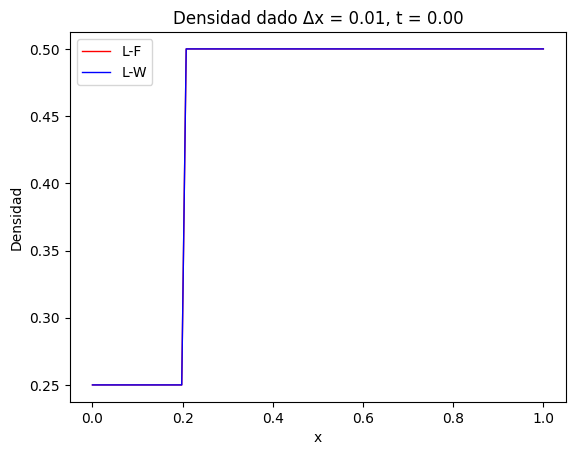

In [ ]:
#Grafico densidad
ani_den0=animar_soluciones_densidad(x0, rho_LF0, rho_LW0, N_T0, T, dx0)
HTML(ani_den0.to_html5_video())

 GIF guardado como 'velocidad_0.01.gif'


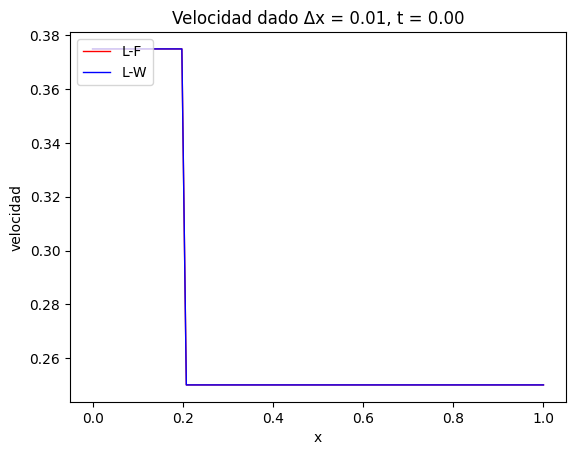

In [ ]:
#Graficos velocidad
ani_vel0=animar_soluciones_velocidad(x0, v_LF0, v_LW0, N_T0, T, dx0)
HTML(ani_vel0.to_html5_video())

##Caso Δx = 0.005

In [ ]:
#caso Delta x = 0.005

#Vectores delta x y delta t
dx1=Dx[1]
dt1=Dt[1]

#Puntos interiores
N1 = int((b-a)/dx1)
u01=np.zeros(N1+2)
x1 = np.linspace(a,b, N1+2)

#Vector Condicion Inicial
for j in range(N1+2):
  u01[j] = u_0(x1[j])

#otros valores
N_T1 = int(T/dt1)

#Metodo LF
U_LF1=resolver_B(f, a, b, u_a, u_b, dt1, N_T1, N1, u01, "LF")

#Metodo LW
U_LW1=resolver_B(f, a, b, u_a, u_b, dt1, N_T1, N1, u01, "LW")

#Resultados densidad vehicular
rho_LF1 = (D/2)*(1-U_LF1)
rho_LW1 = (D/2)*(1-U_LW1)

#Resultados velocidad
v_LF1 = V*(1-(rho_LF1)/D)
v_LW1 = V*(1-(rho_LW1)/D)

 GIF guardado como 'densidad_0.005.gif'


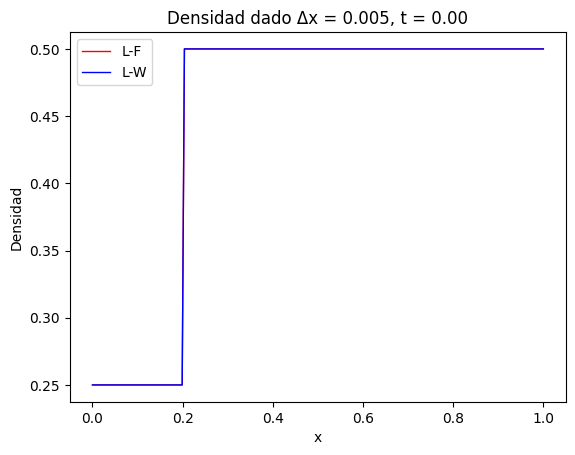

In [ ]:
#Grafico densidad
ani_den1=animar_soluciones_densidad(x1, rho_LF1, rho_LW1, N_T1, T, dx1)
HTML(ani_den1.to_html5_video())

 GIF guardado como 'velocidad_0.005.gif'


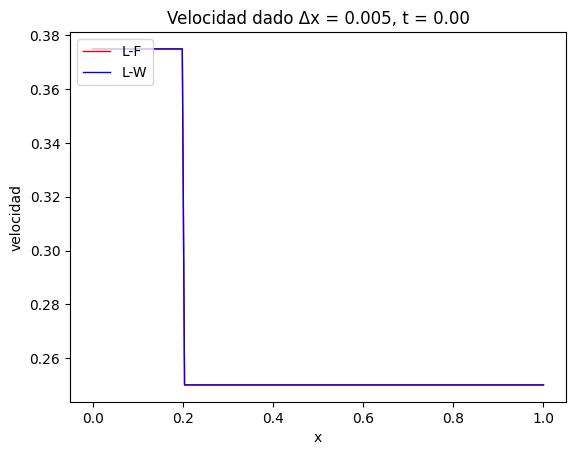

In [ ]:
#Graficos velocidad
ani_vel1=animar_soluciones_velocidad(x1, v_LF1, v_LW1, N_T1, T, dx1)
HTML(ani_vel1.to_html5_video())

##Caso Δx = 0.002

In [ ]:
#caso Delta x = 0.002

#Vectores delta x y delta t
dx2=Dx[2]
dt2=Dt[2]

#Puntos interiores
N2 = int((b-a)/dx2)
u02=np.zeros(N2+2)
x2 = np.linspace(a,b, N2+2)

#Vector Condicion Inicial
for j in range(N2+2):
  u02[j] = u_0(x2[j])

#otros valores
N_T2 = int(T/dt2)

#Metodo LF
U_LF2=resolver_B(f, a, b, u_a, u_b, dt2, N_T2, N2, u02, "LF")

#Metodo LW
U_LW2=resolver_B(f, a, b, u_a, u_b, dt2, N_T2, N2, u02, "LW")

#Resultados densidad vehicular
rho_LF2 = (D/2)*(1-U_LF2)
rho_LW2 = (D/2)*(1-U_LW2)

#Resultados velocidad
v_LF2 = V*(1-(rho_LF2)/D)
v_LW2 = V*(1-(rho_LW2)/D)

 GIF guardado como 'densidad_0.002.gif'


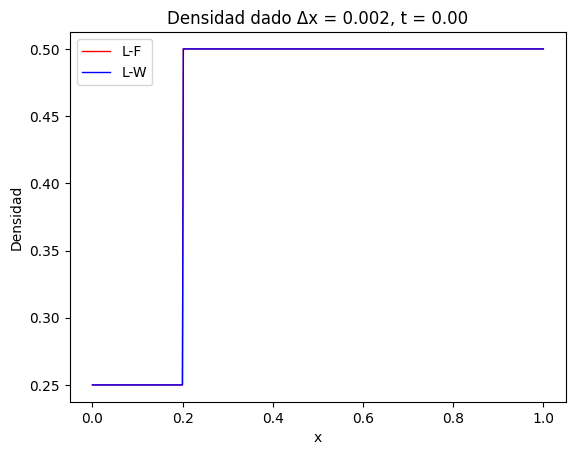

In [ ]:
#Grafico densidad
ani_den2=animar_soluciones_densidad(x2, rho_LF2, rho_LW2, N_T2, T, dx2)
HTML(ani_den2.to_html5_video())

 GIF guardado como 'velocidad_0.002.gif'


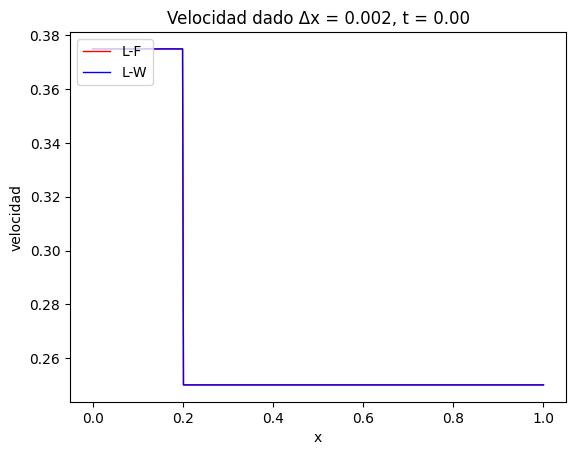

In [ ]:
#Graficos velocidad
ani_vel2=animar_soluciones_velocidad(x2, v_LF2, v_LW2, N_T2, T, dx2)
HTML(ani_vel2.to_html5_video())


### P2

* Ahora, se modelará el efecto de un semáforo en rojo, el cual cambiará a verde en un par de segundos. Para ello, el tramo vial a estudiar corresponderá con el intervalo $\left[ 0,2\right] $.


* Si existe un semáforo en $x=1$, nuestro dominio de interés para modelar el efecto de la luz roja mediante la ecuación de Burgers será el intervalo $\left[  0,1\right]  $. Suponga que los autos entran por $x=0$ a una velocidad constante, la cual se representará por $u\left(  t,0\right)  =u^{\ast}$. Por otra parte, los vehículos deben detenerse frente al semáforo, por lo que
$u(t,1)=-1$.

* Además, se asume que todos los vehículos circulan a una velocidad inicial constante $u\left(  0,x\right)  =u^{\ast}$ hasta que ven el semáforo en rojo. En el instante $t=T$ en que el semáforo cambia a verde, la densidad de vehículos es nula en $\omega_{2}=\left(  1,2\right]  $. Luego, $u(T,x)=1$, para $x\in\omega_{2}$.



> Simule el efecto del semáforo que cambia de color rojo a verde.<br>
<br>
**a.** Resuelva numéricamente la ecuación de Burgers para $t\in\left[0,2\right]  $ en el dominio $\omega_{1}=\left[  0,1\right]  $, considerando la condición inicial:<br>
<br>
\begin{align*}
u\left(  0,x\right)  =\left\{
\begin{array}
[c]{cl}%
u^{\ast} & \text{si }0\leq x<1\\
-1 & \text{si }x=1
\end{array}
\right.
\end{align*}<br>
y las condiciones de frontera $u\left(  t,0\right)  =u^{\ast}$ y $u(t,1)=-1$, con $u^{\ast}=0.25$. Para ello, use el esquema de Lax-Friedrichs con $\Delta x=0.02$ y $\Delta t=0.1\Delta x$, simulando un semáforo en rojo que dure $T=2$.

In [ ]:
def f(u):
  return (u**2)/2

# Condición inicial :
def u_0(x,u_inicial=0.25) :
  if x >=0 and x<1 :
    return u_inicial
  if x == 1 :
    return -1

# Dominio Omega_1 = [0,1]
a,b = 0,1
# Condiciones de borde u(t,a) = ua y u(t,b) =ub
ua,ub = 0.25,-1

dx = 0.02
T,dt = 2, 0.1*dx

N_T=int(T/dt)
N=int((b-a)/dx)
t = np.linspace(0,2,N_T+1)
x = np.linspace(a,b, N+2)

u0 = np.zeros(N+2)
for j in range(N+2) :
  u0[j] = u_0(x[j])

In [ ]:
u_R = resolver_B(f, a, b, ua, ub, dt, N_T, N, u0, esquema="LF")

> **b.** Resuelva numéricamente la ecuación de Burgers para $t\in\left[2,4\right]  $ y $\Omega=\omega_{1}\cup\omega_{2}=\left[  0,2\right]  $, considerando las condiciones de frontera $u\left(  t,0\right)  =u^{\ast}$ y $u(t,2)=1$, y la condición inicial dada por:<br>
<br>
\begin{align*}
u\left(  2,x\right)  =\left\{
\begin{array}
[c]{cl}%
u_{R}\left(  2,x\right)   & \text{si }0\leq x\leq1\\
1 & \text{si }x>1
\end{array}
\right.
\end{align*}<br>
donde $u_{R}\left(  2,x\right)  $ es la solución numérica resultante en el ejercicio anterior. Use los mismos parámetros y esquema que la parte previa y grafique su solución solo en el conjunto $\omega_1$.

In [ ]:
# Condicion inicial pero en el tiempo t = 2, es decir, cuando se inicia el otro intervalo desde que en x=1 se detiene
def u_2(x):
  if x>= 0 and x<=1:
    # Como x_j = j*dx = j * (b-a)/(N+1) => j = x_j*(N+1)/(b-a)
    # Se toma la parte entera pues j debe ser un entero.
    j = int((x*(N+1))/(b-a))
    return u_R[j,-1] # En la ultima columna temporal extraemos cada valor de u_R en el espacio.
  if x > 1 :
    return 1

In [ ]:
def f(u):
  return (u**2)/2

# Dond los dominios son Omega_1 = [0,1] U Omega_2 = (1,2] tal que Omega = Omega_1 U Omega_2
a,b = 0,2
# Condiciones de borde u(t,a=0) = ua =u* =0.25 y u(t,b=2) =ub = 1
ua,ub = 0.25, 1

dx = 0.02
T,dt = 2, 0.1*dx

N_T=int(T/dt)
N=int((b-a)/dx)

u0 = np.zeros(N+2)
x = np.linspace(a,b, N+2)
for j in range(N+2) :
  u0[j] = u_2(x[j])

In [ ]:
u_aprox_final = resolver_B(f, a, b, ua, ub, dt, N_T, N, u0, esquema="LF")

In [ ]:
# Creado con ayuda de ChatGPT :
def animar_soluciones_semaforo(x,ULF,dt,t,N_T,dx,interval=30) :

    # Crear figura
    fig, ax = plt.subplots()
    ax.set_xlabel("x")
    ax.set_ylabel("uLF(x,t)")
    ax.set_title("Solución con Lax-Friedrichs para Simluación de Semaforo")

    # Inicializar líneas
    linea_LF, = ax.plot(x,ULF[:,0], label='LF', color='blue')

    ax.legend()
    plt.close()
    # Función de animación
    def animate(i):
        linea_LF.set_data(x, ULF[:, i])

        ax.set_title(f"Aproximacion LF para Δx = {dx:.2f}\nt = {t[i]:.2f}",fontfamily='monospace')
        # ax.set_title(f"t = {t[i]:.2f}")
        return [linea_LF]
# Creado con ayuda de ChatGPT :
def animar_soluciones_semaforo(x,ULF,dt,t,N_T,dx,interval=30) :

    # Crear figura
    fig, ax = plt.subplots()
    ax.set_xlabel("x")
    ax.set_ylabel("$u_{LF}(x,t)$")
    ax.set_title("Solución con Lax-Friedrichs para Simluación de Semaforo")

    # Inicializar líneas
    linea_LF, = ax.plot(x,ULF[:,0], label='LF', color='blue')

    ax.legend()
    plt.close()
    # Función de animación
    def animate(i):
        linea_LF.set_data(x, ULF[:, i])

        ax.set_title(f"Aproximacion LF para Δx = {dx:.2f}\nt = {t[i]:.2f}",fontfamily='monospace')
        # ax.set_title(f"t = {t[i]:.2f}")
        return [linea_LF]

    # Crear la animación
    ani = animation.FuncAnimation(fig, animate, frames=N_T+1, interval=interval, blit=True, repeat=True)
    # ani.save("grafico" + str(lanbda) + ".gif") # se guarda en la carpeta de la izquierda de colab como .gif
    return HTML(ani.to_html5_video())

In [ ]:
# Extraemos las soluciones en solo Omega1 en todo tiempo :
ULF = u_aprox_final[:51,:]
# Lo mismo para el espacio solo hasta 50, su len(x) = 102
x = x[:51]
# tiempo es de 2 a 4 :
t = np.linspace(2,4,N_T+1)

animar_soluciones_semaforo(x,ULF,dt,t,N_T,dx,interval=30)

> **c.** Haga una interpretación de sus resultados, haciendo un análisis cualitativo de lo observado.

En cuanto a la primera sección de la pregunta, se modeló el comportamiento en el tramo vial con un semáforo en $x=1$, el cual esta en rojo durante los dos primeros segundos. Obteniendose asi una curva decreciente que señala que el vehiculo se detiene en la llegada del semáforo. Tomando el resultado anterior como condición inicial, se observa un aplanamiento de la curva, acercandose a un valor cercano a cero, este comportamiento podría estar explicado por la rarefacción, ya que se va de una zona de mayor densidad a una de menor densidad, por lo que progresivamente la densidad va a ir disminuyendo, y consecuentemente un aumento en la velocidad.